# Visualization Showcase
2025-11-23

This notebook showcases some of the functionality of visualizing velocity fields, using the CloudAtlasVisualizationExt.

In order to use the visualization tools of CloudAtlas, you need to be `using CairoMakie`. 
CairoMakie is kept as a weak dependency to maintain the independence of the main CloudAtlas software.

By default, the laminar baseflow is disabled. You might be surprised by the streamwise velocity because of that.
All plotting functions have an optional `add_baseflow` flag which enables the laminar flow by just adding the $y$ coordinate to $u$.

In [1]:
using LinearAlgebra, Polynomials, Plots
using Revise, DelimitedFiles, BenchmarkTools
using CairoMakie # this triggers the extension to load
using CloudAtlas

"""
    myreaddlm(filename, cc='%')

Read matrix or vector from a file, dropping comments marked with cc.
"""
function myreaddlm(filename; cc='%')
    X = readdlm(filename, comments=true, comment_char=cc)
    if size(X,2) == 1
        X = X[:,1]
    end
    X
end

sx, sy, sz, tx, tz = halfbox_symmetries()

pwd()

"/home/ebenq/Dev/julia/CloudAtlas.jl/notebooks"

## Visualizing a Field
The following showcases the visualization of a field equilibrium. First, we find the eqb.

In [2]:
# Define symmetry group (e.g., σy symmetry)
H = [sx*sy*sz, sz*tx*tz]

# Create ODE model
α = 1.0  # 2π/Lx
γ = 2.0  # 2π/Lz
J, K, L = 1, 2, 3
model = ODEModel(α, γ, J, K, L, H)

xguess = myreaddlm("data/xeq1projection-Re200-1-2-3-27d.asc")

R = 200

fr = x -> model.f(x,R)    # define function  f(x) = f(x,R)  for fixed R
Dfr = x -> model.Df(x,R)  # define function Df(x) = Df(x,R) for fixed R

@time xeq1, eq1success = hookstepsolve(fr, Dfr, xguess)
eq1success

J,K,L,m == 1,2,3,27
(2J+1)(2K+1)(2L+1) + 1 == 106
Making matrices B,A1,A2,S3...
Making quadratic operator N...
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 
  1.073335 seconds (2.37 M allocations: 123.569 MiB, 3.20% gc time, 99.80% compilation time: 1% of which was recompilation)


true

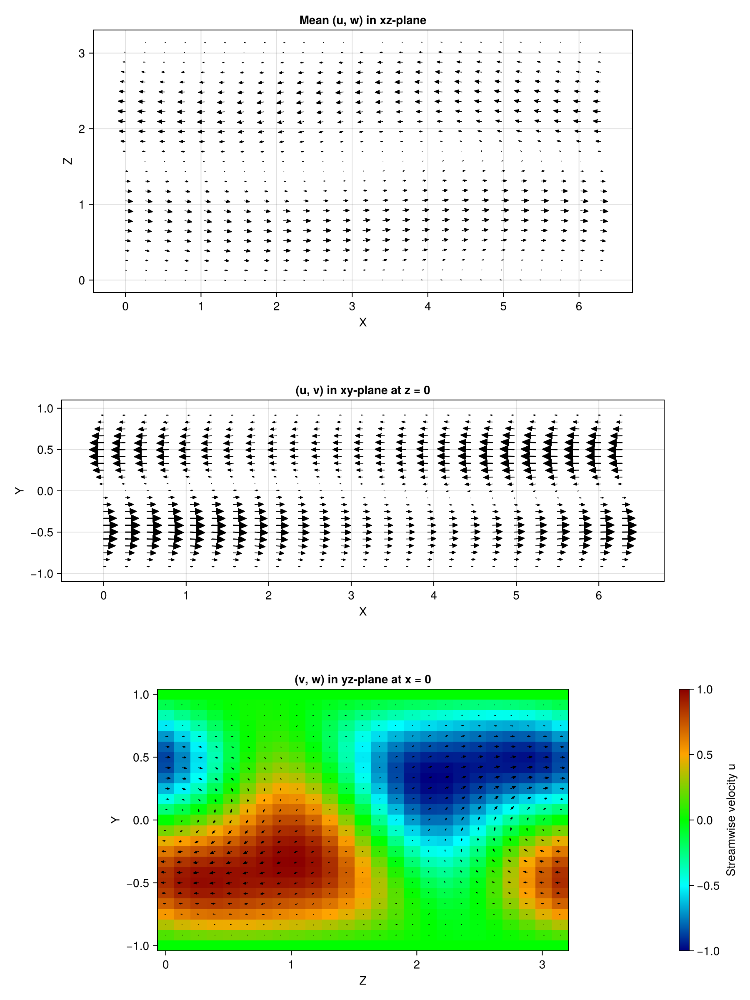

In [3]:
# Visualize velocity field
settings = PlotSettings(num_points=25, arrow_scale=0.5)
fig = velocity_fields(model, xeq1, settings=settings)

## Comparison to DNS Data
An important comparison is visualizing how the velocity field relates to the DNS data. The following demonstrates such a comparison.

This uses a fairly high resolution model, with a 320 variable ODE model. 

The DNS data is generated with the `plotfield` Channelflow utility, which is included in the `chflow-programs` directory.

In [4]:
α, γ = 1.0, 2.0                     # Fourier wavenumbers α, γ = 2π/Lx, 2π/Lz
J,K,L = 3,3,6                       # Bounds on Fourier modes (J,K) and wall-normal polynomials (L)
H = [(sx*sy)*(tx*tz)]               # Generators of the symmetric subspace of TW1
normalize = false                   # Normalize the basis set or not?
model = ODEModel(α, γ, J, K, L, H, normalize=normalize)  # Construct ODE model by Galerkin projection 
@show m = length(model)             # dimension of ODE model

J,K,L,m == 3,3,6,320
(2J+1)(2K+1)(2L+1) + 1 == 638
Making matrices B,A1,A2,S3...
Making quadratic operator N...
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 

320

In [5]:
# Parameters
hookparams = SearchParams(ftol=1e-08, xtol=1e-12, Nnewton=30,Nhook=8,δ=0.01, verbosity=0)
R = 200
x0 = myreaddlm("data/xtw2projection-Re200-3-3-6-320d.asc")

# Create closures for g and Dg that capture R
f_closure(x) = model.f(x, R)
Df_closure(x) = model.Df(x, R)

# Use hookstep to find a solution
ξ_final, converged = hookstepsolve(f_closure, Df_closure, x0, hookparams)
x_sol = ξ_final[1:m]
println("Norm of solution: ", norm(x_sol))
println("Converged: ", converged)

Norm of solution: 0.4326345473611807
Converged: true


In [6]:
settings = PlotSettings(num_points = 40)
fig1, fig2, fig3 = velocity_fields_comparison(model, x_sol, "./data/tw1_plots/TW1-2pi1piRe200-40x49x40"; settings=settings, add_baseflow = false)

DNS grid: Nx × Ny × Nz = 41 × 49 × 41


(Scene(2 children, 0 plots), Scene(2 children, 0 plots), Scene(3 children, 0 plots))

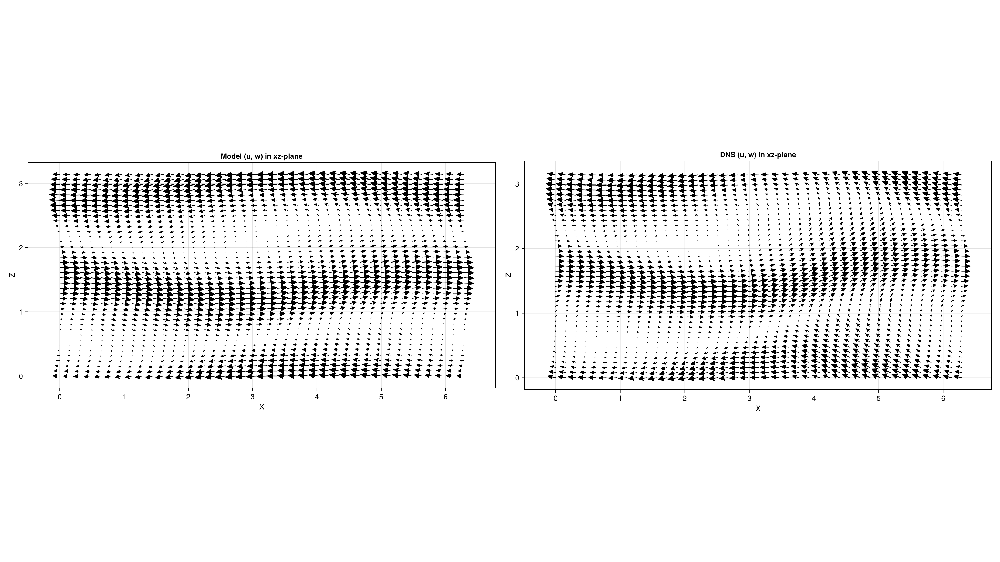

CairoMakie.Screen{IMAGE}


In [7]:
display(fig1)

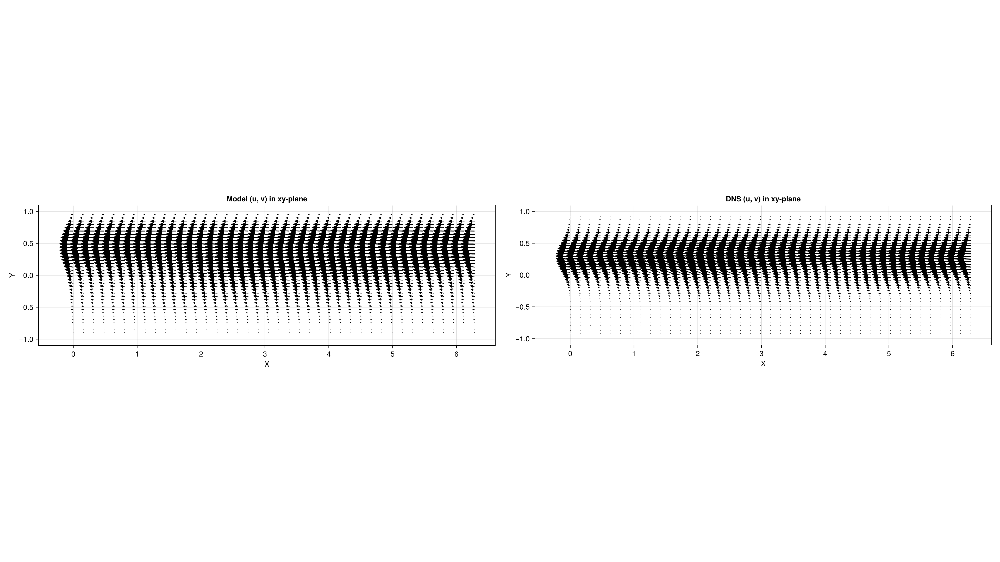

CairoMakie.Screen{IMAGE}


In [8]:
display(fig2)

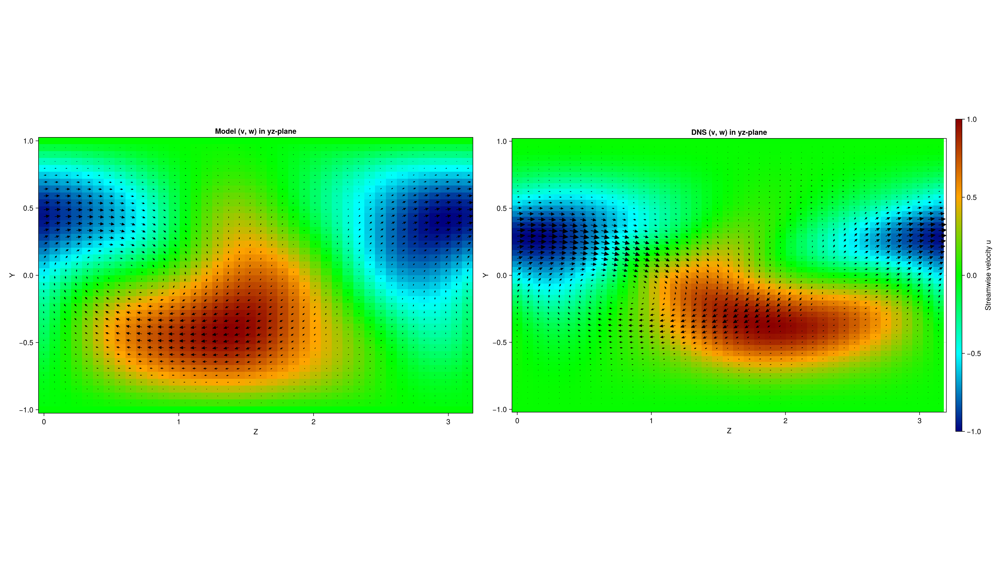

CairoMakie.Screen{IMAGE}


In [9]:
display(fig3)

## Adding Baseflow
The following graphs demonstrate what changes when we enable the `add_baseflow` flag. Notably, you need DNS data that also has the laminar profile added, which could be done with the `addfield` Channelflow utility. 

In [10]:
fig1, fig2, fig3 = velocity_fields_comparison(model, x_sol, "./data/tw1_plots/TW1_Re200_with_baseflow"; settings=settings, add_baseflow = true)

DNS grid: Nx × Ny × Nz = 41 × 49 × 41


(Scene(2 children, 0 plots), Scene(2 children, 0 plots), Scene(3 children, 0 plots))

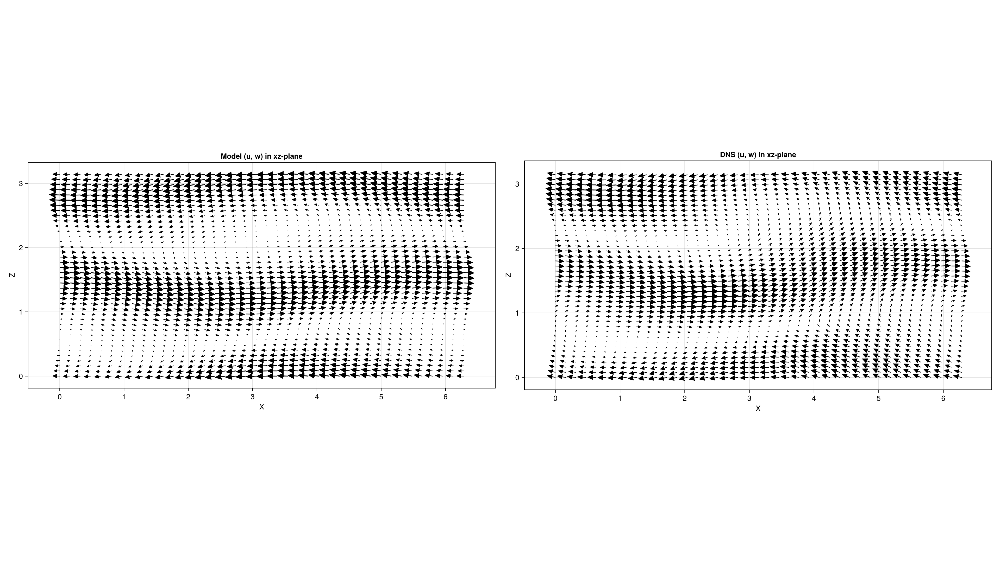

CairoMakie.Screen{IMAGE}


In [11]:
display(fig1)

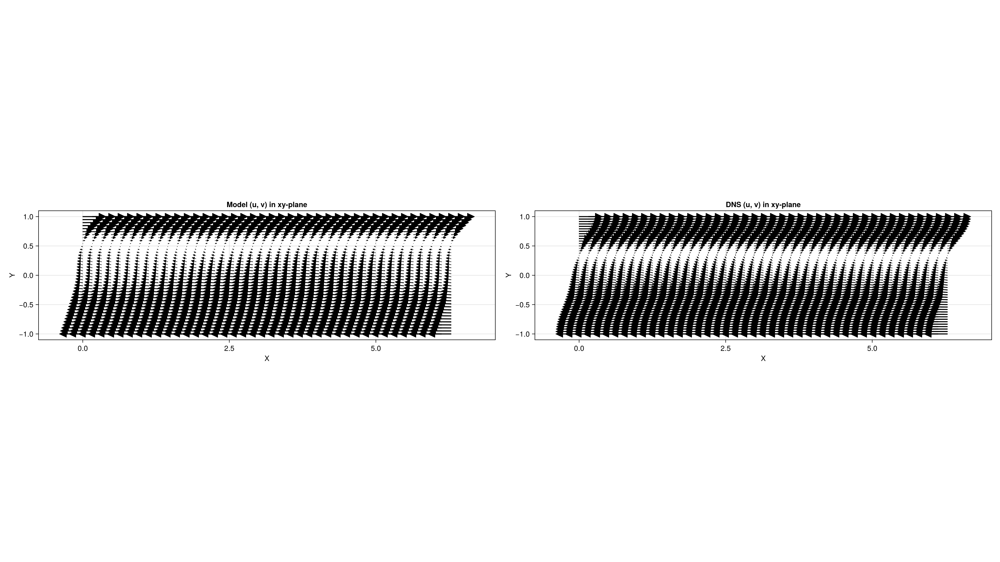

CairoMakie.Screen{IMAGE}


In [12]:
display(fig2)

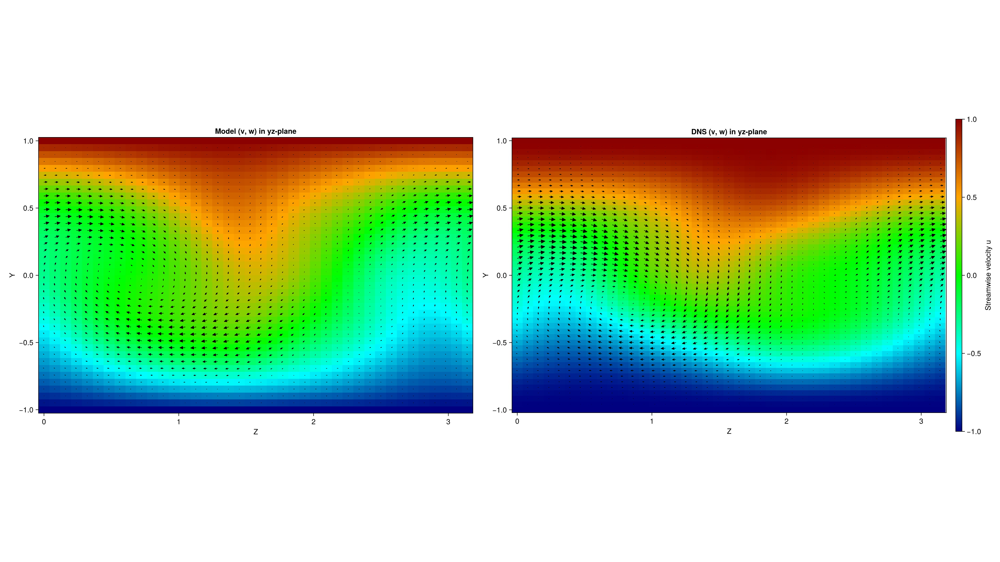

CairoMakie.Screen{IMAGE}


In [13]:
display(fig3)